<a href="https://colab.research.google.com/github/Esteban191/proyecto/blob/master/Segmentacion_adui_no_supervisada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Dependecias

In [ ]:
pip install scikit-maad

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.4/142.4 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 41.2 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
from google.colab import drive, output
drive.mount('/content/drive')
%load_ext autoreload
%autoreload 1
sys.path.append('/content/drive/MyDrive/Jaguas_2018')
%cd '/content/drive/MyDrive/Jaguas_2018'
    

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/.shortcut-targets-by-id/1nfTdDkppiuyI6pOFb93wUYtK8j6DA0cv/Jaguas_2018


#Librerias

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn 
import librosa
import os
from pathlib import Path
import librosa.display
from librosa.display import specshow
import pickle
from IPython.display import Audio #reproducir audio
from sklearn.cluster import KMeans

#cargar audios

In [ ]:
root_path = '/content/drive/MyDrive/Jaguas_2018'
folders = os.listdir(root_path)
files = []
for i in range(len(folders)):
    path_aux = "{}/{}".format(root_path, folders[i])
    files += list(Path(path_aux).rglob("*.{}".format("wav")))

filename = str(files[1400])

print(filename)


/content/drive/MyDrive/Jaguas_2018/G49_m/G49_20180627_095200.wav


#implementacion libreria Scikit-maad

##Encuentre la región de interés utilizando estimaciones conocidas de la longitud de la señal y los límites de frecuencia.

El enfoque general se basa en la transformada wavelet continua siguiendo un proceso de tres pasos

###Filter the signal with a bandpass sinc filter

###Smoothing the signal by convolving it with a Mexican hat wavelet (Ricker wavelet)

###Binarize the signal applying a linear threshold

/usr/local/lib/python3.9/dist-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


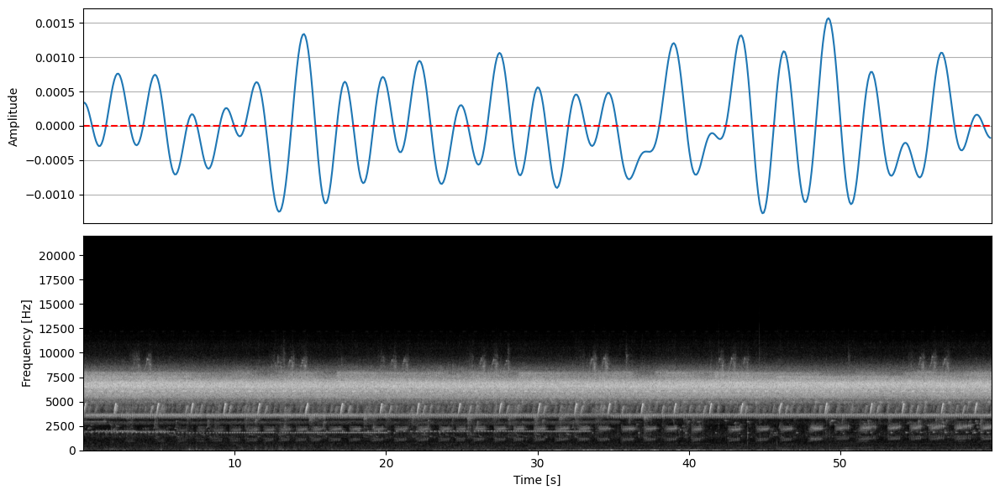

'\n\nsndarray\nseñal de entrada\n\nendeble\nfrecuencias superior e inferior (en Hz)\n\ntlenint\nduración temporal de la señal buscada (en s)\n\nflotador, opcional\numbral para binarizar la salida\n\npantalla: booleano, opcional, el valor predeterminado es falso\ntrazar los resultados si se establece en Verdadero, el valor predeterminado es Falso\n\nsave_dfbooleano, opcional\nguardar los resultados en un archivo csv\n\nsavefilenamestr, opcional\nNombre del archivo para guardar la tabla como valores separados por comas (csv)\n\nDevoluciones:\nmarco de datos de roispandas\nuna tabla con los límites temporales y frecuenciales de las regiones de interés\n'

In [ ]:
from maad import sound, rois
s, fs = sound.load(filename)
rois.find_rois_cwt(s, fs, flims=(1000,8000), tlen=2, th=0, display=True)
#fimls = upper and lower frequencies (in Hz)
"""

sndarray
señal de entrada

endeble
frecuencias superior e inferior (en Hz)

tlenint
duración temporal de la señal buscada (en s)

flotador, opcional
umbral para binarizar la salida

pantalla: booleano, opcional, el valor predeterminado es falso
trazar los resultados si se establece en Verdadero, el valor predeterminado es Falso

save_dfbooleano, opcional
guardar los resultados en un archivo csv

savefilenamestr, opcional
Nombre del archivo para guardar la tabla como valores separados por comas (csv)

Devoluciones:
marco de datos de roispandas
una tabla con los límites temporales y frecuenciales de las regiones de interés
"""


# New Section

In [ ]:
import maad
s, fs = maad.sound.load(filename)
Sxx,tn,fn,ext = maad.sound.spectrogram (s, fs, fcrop=(0,10000))   

/usr/local/lib/python3.9/dist-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


In [ ]:
Sxx_dB = maad.util.power2dB(Sxx) +70

In [ ]:
Sxx_dB_blurred = maad.sound.smooth(Sxx_dB)

In [ ]:
im_bin = maad.rois.create_mask(Sxx_dB_blurred, bin_std=2, bin_per=0.5, mode='relative') 

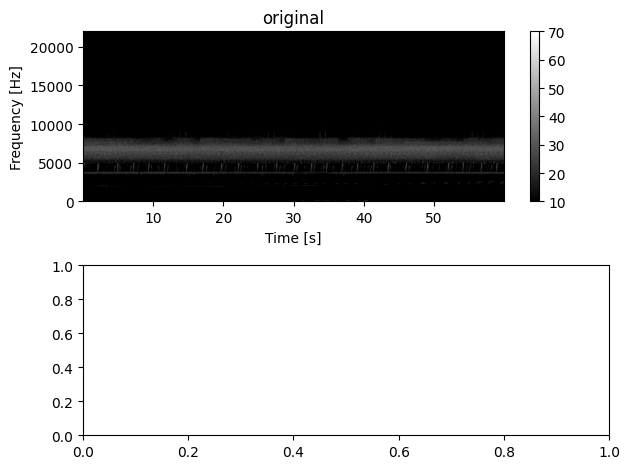

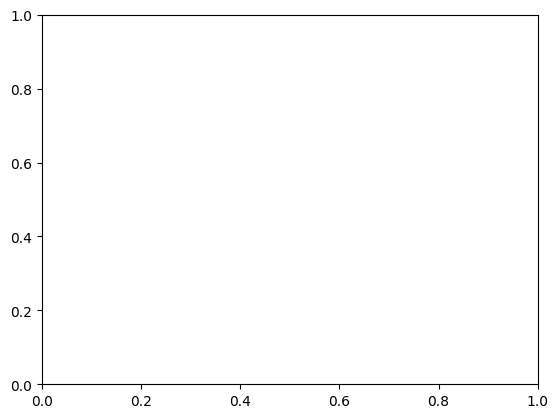

In [ ]:
import matplotlib.pyplot as plt 
fig, (ax1, ax2) = plt.subplots(2, 1)
maad.util.plot2d(Sxx_dB, ax=ax1, extent=ext, title='original', vmin=10, vmax=70)
maad.util.plot2d(im_bin, ax=ax2, extent=ext, title='mask')
fig.set_size_inches(13,8)
fig.tight_layout() 

###

In [ ]:
s, fs = maad.sound.load(filename)
Sxx,tn,fn,ext = maad.sound.spectrogram(s, fs)
freq_idx = np.where(fn <= 8000)[0]
Sxx = Sxx[freq_idx,:]
fn = fn[freq_idx]
Sxx_dB = maad.util.power2dB(Sxx) + 70

/usr/local/lib/python3.9/dist-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


In [ ]:
Sxx_dB_blurred = maad.sound.smooth(Sxx_dB)

In [ ]:
im_bin = maad.rois.create_mask(Sxx_dB_blurred, bin_std=1.5, bin_per=0.5, mode='relative')

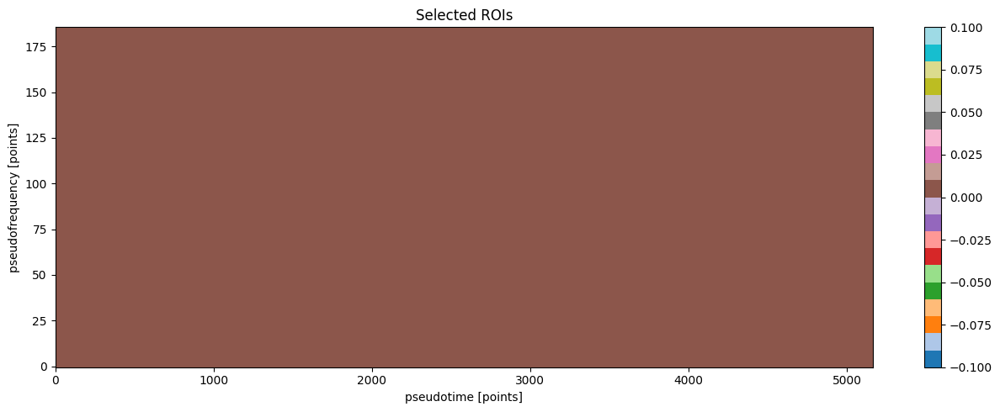

In [ ]:
im_rois, df_rois = maad.rois.select_rois(im_bin, display=True)

In [ ]:
s.shape

(2645760,)

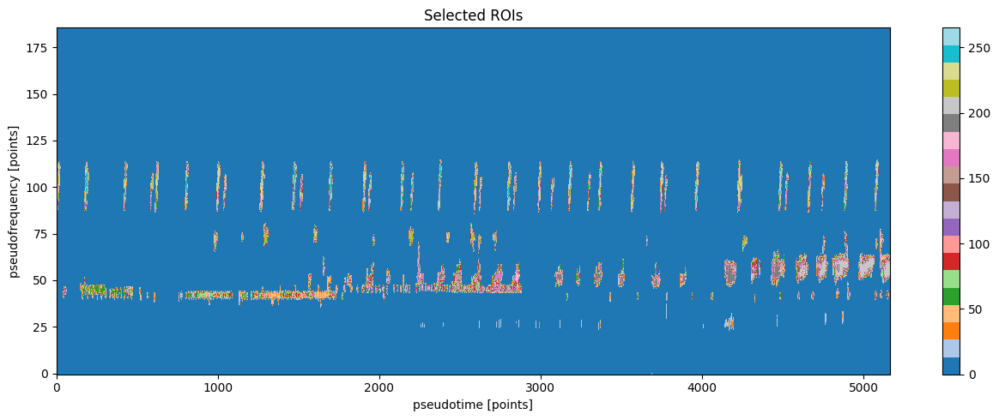

In [ ]:
Sxx_noNoise = maad.sound.median_equalizer(Sxx)
Sxx_noNoise_dB = maad.util.power2dB(Sxx_noNoise)     
Sxx_noNoise_dB_blurred = maad.sound.smooth(Sxx_noNoise_dB)        
im_bin2 = maad.rois.create_mask(Sxx_noNoise_dB_blurred, bin_std=8, bin_per=0.5, mode='relative') 
im_rois2, df_rois2 = maad.rois.select_rois(im_bin2, display=True)

<ipython-input-30-4fdb6172a347>:14: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max))


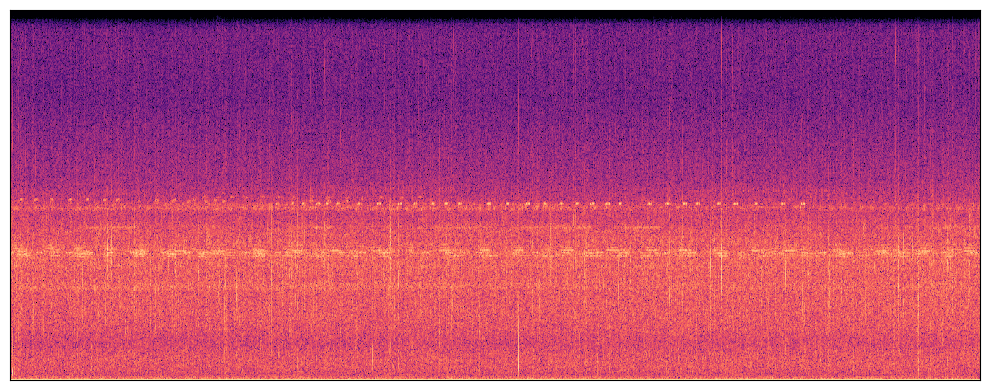

In [ ]:
n_fft = 1024
y, sr = librosa.load(filename, sr=44100)

#RELAIZAR RESAMPLE DE TAZA DE MUESTREO
y = librosa.resample(y, orig_sr=44100, target_sr=22050)
sr = 22050

S = librosa.stft(y, n_fft=n_fft)



# Graficar el espectrograma
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max))
#plt.title('Espectrograma Promedio')
#plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/PSD/espectrograma_G50_m.png", format="png")
plt.show()

#Pruebas

In [ ]:

import numpy as np
import pandas as pd
from maad import sound, rois, features
from maad.util import (power2dB, plot2d, format_features, read_audacity_annot,
                       overlay_rois, overlay_centroid)

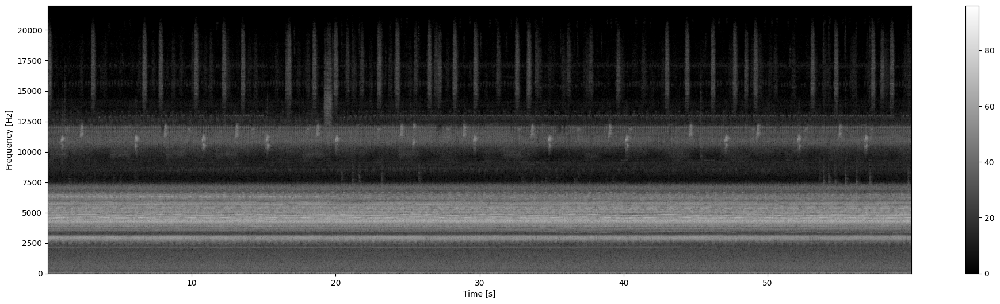

(<Axes: xlabel='Time [s]', ylabel='Frequency [Hz]'>,
 <Figure size 1978.86x540.139 with 2 Axes>)

In [ ]:

s, fs = sound.load(filename)

dB_max = 96

Sxx_power, tn, fn, ext = sound.spectrogram(s, fs, nperseg=1024, noverlap=1024//2)

# Convert the power spectrogram into dB, add dB_max which is the maximum decibel
# range when quantification bit is 16bits and display the result
Sxx_db = power2dB(Sxx_power) + dB_max
plot2d(Sxx_db, **{'vmin':0, 'vmax':dB_max, 'extent':ext})

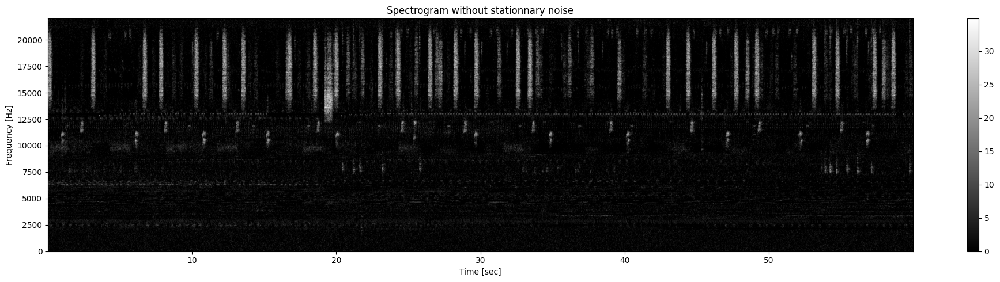

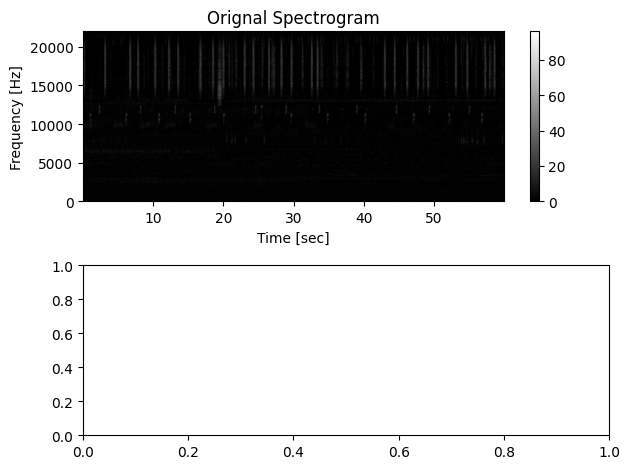

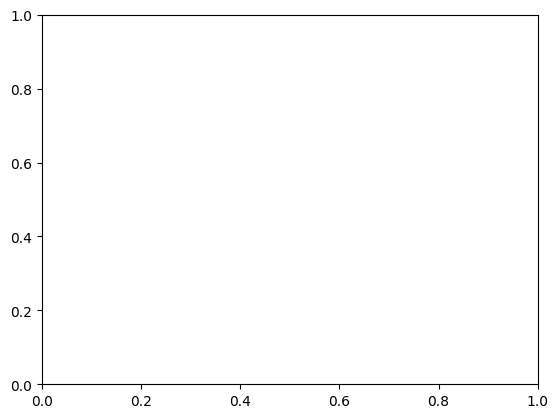

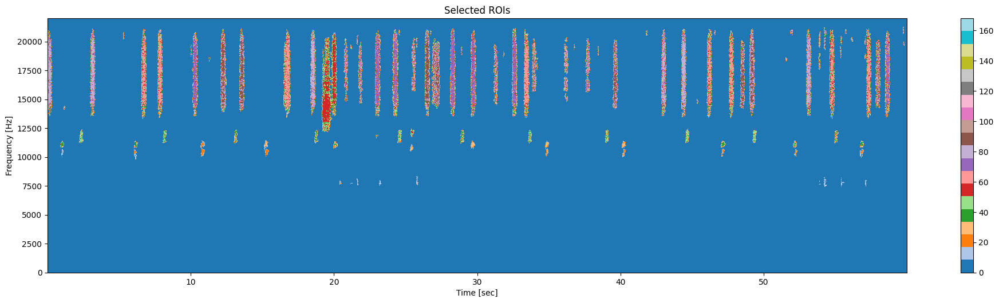

Total number of ROIs : 134
Number of different ROIs :  1


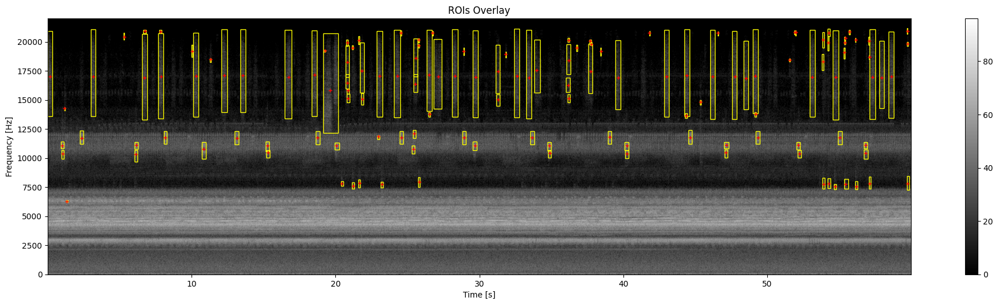

In [ ]:
# First we remove the stationary background in order to increase the contrast [1]
# Then we convert the spectrogram into dB
Sxx_power_noNoise= sound.median_equalizer(Sxx_power, display=True, **{'extent':ext})
Sxx_db_noNoise = power2dB(Sxx_power_noNoise)

# Then we smooth the spectrogram in order to facilitate the creation of masks as
# small sparse details are merged if they are close to each other
Sxx_db_noNoise_smooth = sound.smooth(Sxx_db_noNoise, std=0.5,
                         display=True, savefig=None,
                         **{'vmin':0, 'vmax':dB_max, 'extent':ext})

# Then we create a mask (i.e. binarization of the spectrogram) by using the
# double thresholding technique
im_mask = rois.create_mask(im=Sxx_db_noNoise_smooth, mode_bin ='relative',
                           bin_std=8, bin_per=0.5,
                           verbose=False, display=False)

# Finaly, we put together pixels that belong to the same acoustic event, and
# remove very small events (<=25 pixel²)
im_rois, df_rois = rois.select_rois(im_mask, min_roi=25, max_roi=None,
                                 display= True,
                                 **{'extent':ext})

# format dataframe df_rois in order to convert pixels into time and frequency
df_rois = format_features(df_rois, tn, fn)

# overlay bounding box on the original spectrogram
ax0, fig0 = overlay_rois(Sxx_db, df_rois, **{'vmin':0, 'vmax':dB_max, 'extent':ext})

# Compute and visualize centroids
df_centroid = features.centroid_features(Sxx_db, df_rois, im_rois)
df_centroid = format_features(df_centroid, tn, fn)
ax0, fig0 = overlay_centroid(Sxx_db, df_centroid, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,'ms':4,
                                'marker':'+', 'color':'red',
                                'fig':fig0, 'ax':ax0})

# print informations about the rois
print('Total number of ROIs : %2.0f' %len(df_rois))
print('Number of different ROIs : %2.0f' %len(np.unique(df_rois['label'])))


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


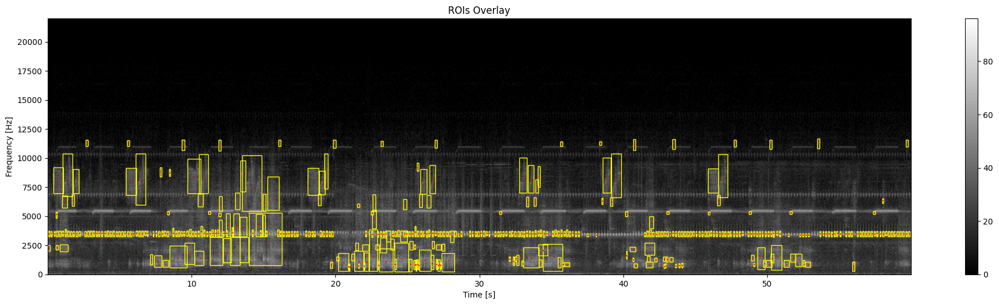

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# select features to perform KMeans clustering
FEATURES = ['centroid_f','duration_t','bandwidth_f','area_tf']

# Prepare the features in order to have zero mean and same variance
X = StandardScaler().fit_transform(df_centroid[FEATURES])

# perform KMeans with the same number of clusters as with the manual annotation
NN_CLUSTERS = len(np.unique(df_rois['label']))
labels = KMeans(n_clusters=NN_CLUSTERS, random_state=0).fit_predict(X)

# Replace the unknow label by the cluster number predicted by KMeans
df_centroid['label'] = [str(i) for i in labels]

# overlay color bounding box corresponding to the label, and centroids
# on the original spectrogram
ax2, fig2 = overlay_rois(Sxx_db, df_centroid, **{'vmin':0,'vmax':dB_max,'extent':ext})
ax2, fig2 = overlay_centroid(Sxx_db, df_centroid, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,
                                'ms':2, 'marker':'+', 'color':'red',
                                'fig':fig2, 'ax':ax2})

In [ ]:
df_rois

IndexError: ignored

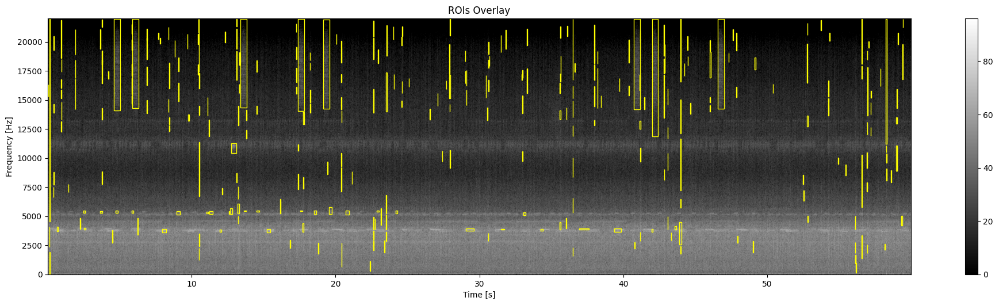

In [ ]:
# drop rows with frequency and time outside of tn and fn

df_rois = df_rois[(df_rois.min_t >= tn.min()) &
                        (df_rois.max_t <= tn.max()) &
                        (df_rois.min_f >= fn.min()) &
                        (df_rois.max_f <= fn.max())]
                       

# format dataframe df_rois in order to convert time and frequency into pixels
df_rois_GT = format_features(df_rois, tn, fn)

# overlay bounding box on the original spectrogram
ax1, fig1 = overlay_rois(Sxx_db, df_rois_GT, **{'vmin':0,'vmax':dB_max,'extent':ext})

# Compute and visualize centroids
df_centroid_GT = features.centroid_features(Sxx_db, df_rois_GT)
df_centroid_GT = format_features(df_centroid_GT, tn, fn)
ax1, fig1 = overlay_centroid(Sxx_db, df_centroid_GT, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,
                                'ms':2, 'marker':'+','color':'red',
                                'fig':fig1, 'ax':ax1})

# print informations about the rois
print ('Total number of ROIs : %2.0f' %len(df_rois_GT))
print ('Number of different ROIs : %2.0f' %len(np.unique(df_rois_GT['label'])))

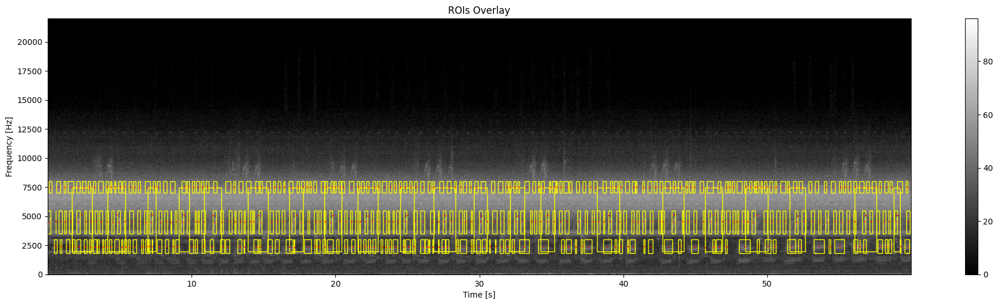

In [ ]:
df_rois_sh = rois.find_rois_cwt(s, fs, flims=[7000, 8000], tlen=0.2, th=0.000001)
df_rois_sm = rois.find_rois_cwt(s, fs, flims=[3500, 5500], tlen=0.2, th=0.000001)
df_rois_lm = rois.find_rois_cwt(s, fs, flims=[2000, 7500], tlen=2,   th=0.0001)
df_rois_sl = rois.find_rois_cwt(s, fs, flims=[1800, 3000], tlen=0.2, th=0.000001)

## concat df
df_rois_WAV =pd.concat([df_rois_sh, df_rois_sm, df_rois_lm, df_rois_sl], ignore_index=True)

# drop rows with frequency and time outside of tn and fn
df_rois_WAV = df_rois_WAV[(df_rois_WAV.min_t >= tn.min()) &
                                      (df_rois_WAV.max_t <= tn.max()) &
                                      (df_rois_WAV.min_f >= fn.min()) &
                                      (df_rois_WAV.max_f <= fn.max())]

# get features: centroid,
df_rois_WAV = format_features(df_rois_WAV, tn, fn)
df_centroid_WAV = features.centroid_features(Sxx_db, df_rois_WAV)

ax3, fig3 = overlay_rois(Sxx_db, df_rois_WAV, **{'vmin':0,'vmax':dB_max,
                                                      'extent':ext})
df_centroid_WAV = format_features(df_centroid_WAV, tn, fn)
ax3, fig3 = overlay_centroid(Sxx_db, df_centroid_WAV, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,
                                'ms':2,'marker':'+', 'color':'red',
                                'fig':fig3, 'ax':ax3})

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


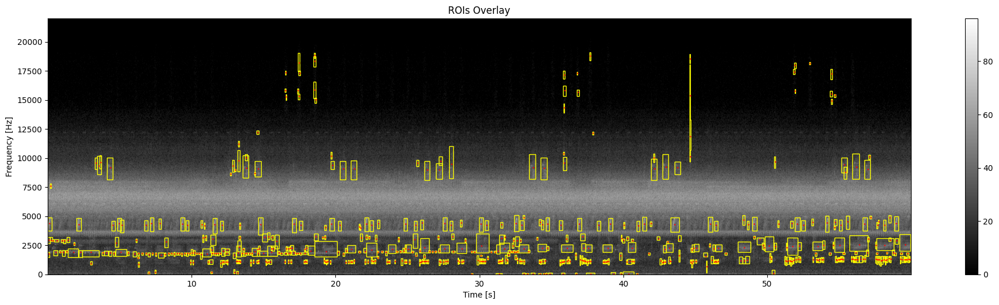

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# select features to perform KMeans clustering
FEATURES = ['centroid_f','duration_t','bandwidth_f','area_tf']

# Prepare the features in order to have zero mean and same variance
X = StandardScaler().fit_transform(df_centroid[FEATURES])

# perform KMeans with the same number of clusters as with the manual annotation
NN_CLUSTERS = len(np.unique(df_rois['label']))
labels = KMeans(n_clusters=NN_CLUSTERS, random_state=0).fit_predict(X)

# Replace the unknow label by the cluster number predicted by KMeans
df_centroid['label'] = [str(i) for i in labels]

# overlay color bounding box corresponding to the label, and centroids
# on the original spectrogram
ax2, fig2 = overlay_rois(Sxx_db, df_centroid, **{'vmin':0,'vmax':dB_max,'extent':ext})
ax2, fig2 = overlay_centroid(Sxx_db, df_centroid, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,
                                'ms':2, 'marker':'+', 'color':'red',
                                'fig':fig2, 'ax':ax2})

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


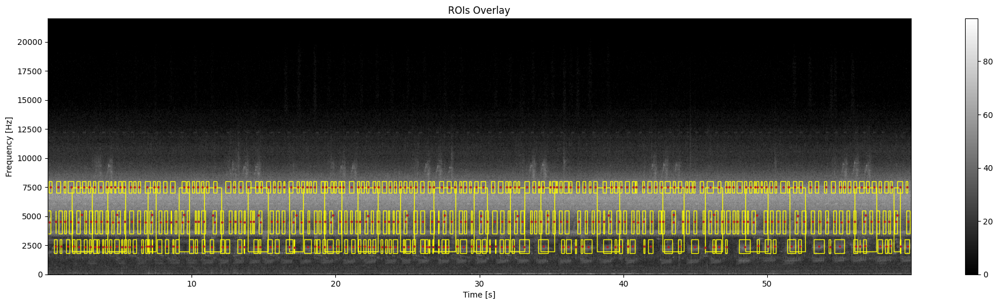

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
X = StandardScaler().fit_transform(df_centroid_WAV[FEATURES])

# perform KMeans with the same number of clusters as with the manual annotation
labels = KMeans(n_clusters=NN_CLUSTERS, random_state=0).fit_predict(X)

# Replace the unknow label by the cluster number predicted by KMeans
df_centroid_WAV['label'] = [str(i) for i in labels]

# overlay color bounding box corresponding to the label, and centroids
# on the original spectrogram
ax4, fig4 = overlay_rois(Sxx_db, df_centroid_WAV, **{'vmin':0,'vmax':dB_max,
                                                          'extent':ext})
ax4, fig4 = overlay_centroid(Sxx_db, df_centroid_WAV, savefig=None,
                             **{'vmin':0,'vmax':dB_max,'extent':ext,
                                'ms':2,'fig':fig4, 'ax':ax4})

#Classify soundtypes with unsupervised learning

In [ ]:
# sphinx_gallery_thumbnail_path = './_images/sphx_glr_plot_unsupervised_sound_classification_004.png'
import numpy as np
import matplotlib.pyplot as plt
from maad import sound, features, rois
from maad.util import power2dB, plot2d, format_features, overlay_rois

/usr/local/lib/python3.9/dist-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


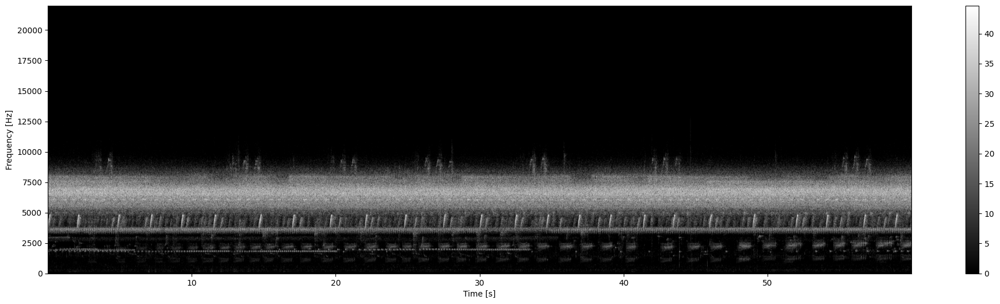

(<Axes: xlabel='Time [s]', ylabel='Frequency [Hz]'>,
 <Figure size 1978.86x540.139 with 2 Axes>)

In [ ]:
s, fs = sound.load(filename)
s_filt = sound.select_bandwidth(s, fs, fcut=100, forder=3, ftype='highpass')

db_max=70  # used to define the range of the spectrogram
Sxx, tn, fn, ext = sound.spectrogram(s_filt, fs, nperseg=1024, noverlap=512)
Sxx_db = power2dB(Sxx, db_range=db_max) + db_max
plot2d(Sxx_db, **{'extent':ext})

In [ ]:
Sxx_db_rmbg, _, _ = sound.remove_background(Sxx_db)
Sxx_db_smooth = sound.smooth(Sxx_db_rmbg, std=1.2)
im_mask = rois.create_mask(im=Sxx_db_smooth, mode_bin ='relative', bin_std=2, bin_per=0.25)
im_rois, df_rois = rois.select_rois(im_mask, min_roi=50, max_roi=None)

# Format ROIs and visualize the bounding box on the audio spectrogram.
df_rois = format_features(df_rois, tn, fn)
ax0, fig0 = overlay_rois(Sxx_db, df_rois, **{'vmin':0, 'vmax':1, 'extent':ext})


#Classify soundtypes with unsupervised learning

In [ ]:
n_fft = 1024
y, sr = librosa.load(filename, sr=44100)

#RELAIZAR RESAMPLE DE TAZA DE MUESTREO
y = librosa.resample(y, orig_sr=44100, target_sr=22050)
sr = 22050

S = librosa.stft(y, n_fft=n_fft)



# Graficar el espectrograma
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max))
#plt.title('Espectrograma Promedio')
#plt.colorbar(format='%+2.0f dB')
plt.tight_layout()
#plt.savefig("/content/drive/MyDrive/PSD/espectrograma_G50_m.png", format="png")
plt.show()

In [ ]:
filename = str(files[1200])

In [ ]:
# sphinx_gallery_thumbnail_path = './_images/sphx_glr_plot_unsupervised_sound_classification_004.png'
import numpy as np
import matplotlib.pyplot as plt
from maad import sound, features, rois
from maad.util import power2dB, plot2d, format_features, overlay_rois

/usr/local/lib/python3.9/dist-packages/maad/sound/input_output.py:113: WavFileWarning: Chunk (non-data) not understood, skipping it.
  fs, s = wavfile.read(filename)


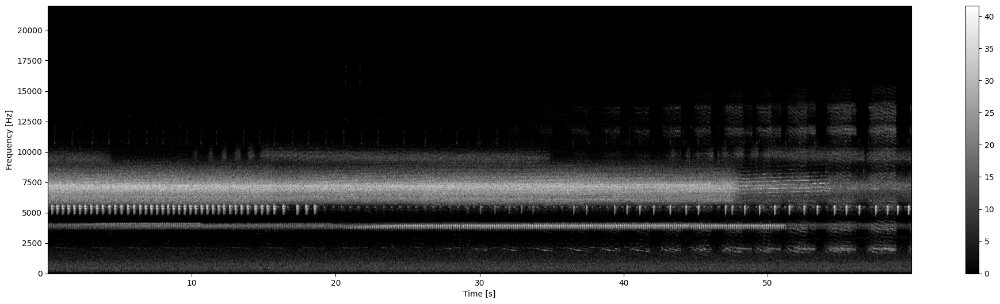

(<Axes: xlabel='Time [s]', ylabel='Frequency [Hz]'>,
 <Figure size 1978.86x540.139 with 2 Axes>)

In [ ]:
s, fs = sound.load(filename)
s_filt = sound.select_bandwidth(s, fs, fcut=100, forder=3, ftype='highpass')

db_max=70  # used to define the range of the spectrogram
Sxx, tn, fn, ext = sound.spectrogram(s_filt, fs, nperseg=1024, noverlap=512)
Sxx_db = power2dB(Sxx, db_range=db_max) + db_max
plot2d(Sxx_db, **{'extent':ext})

In [ ]:
Sxx.shape

(512, 5166)

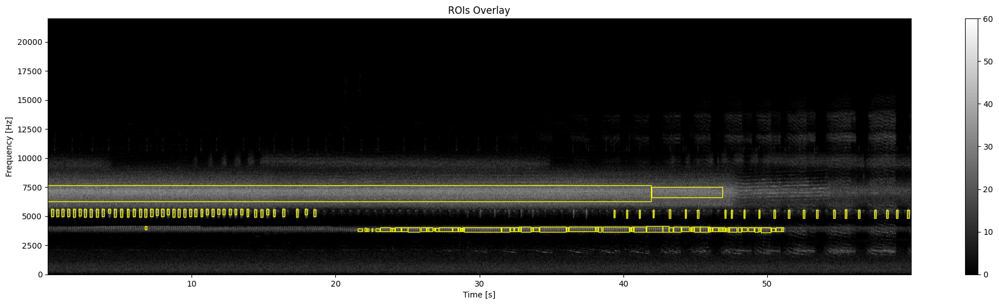

In [ ]:
Sxx_db_rmbg, _, _ = sound.remove_background(Sxx_db)
Sxx_db_smooth = sound.smooth(Sxx_db_rmbg, std=1.2)
im_mask = rois.create_mask(im=Sxx_db_smooth, mode_bin ='relative', bin_std=2, bin_per=0.25)
im_rois, df_rois = rois.select_rois(im_mask, min_roi=50, max_roi=None)

# Format ROIs and visualize the bounding box on the audio spectrogram.
df_rois = format_features(df_rois, tn, fn)
ax0, fig0 = overlay_rois(Sxx_db, df_rois, **{'vmin':0, 'vmax':60, 'extent':ext})

In [ ]:
im_rois.shape

(512, 5166)

In [ ]:
df_rois

,labelID,label,min_y,min_x,max_y,max_x,min_f,min_t,max_f,max_t
0,1,unknown,84,4268,94,4328,3617.578125,49.562993,4048.242188,50.259592
1,2,unknown,85,2156,94,2228,3660.644531,25.042721,4048.242188,25.878639
2,3,unknown,85,2493,94,2714,3660.644531,28.955283,4048.242188,31.521088
3,4,unknown,85,2716,94,2765,3660.644531,31.544308,4048.242188,32.113197
4,5,unknown,85,2832,95,2891,3660.644531,32.891066,4091.308594,33.576054
...,...,...,...,...,...,...,...,...,...,...
128,142,unknown,120,1117,131,1129,5167.968750,12.979955,5641.699219,13.119274
129,143,unknown,121,1015,131,1028,5211.035156,11.795737,5641.699219,11.946667
130,144,unknown,123,362,131,375,5297.167969,4.214422,5641.699219,4.365351
131,145,unknown,146,0,178,3612,6287.695312,0.011610,7665.820312,41.946848


In [ ]:
df_shape, params = features.shape_features(Sxx_db, resolution='low', rois=df_rois)
df_centroid = features.centroid_features(Sxx_db, df_rois)

# Get median frequency and normalize
median_freq = fn[np.round(df_centroid.centroid_y).astype(int)]
df_centroid['centroid_freq'] = median_freq/fn[-1]

/usr/local/lib/python3.9/dist-packages/maad/features/shape.py:343: FutureWarning: `multichannel` is a deprecated argument name for `pyramid_gaussian`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im_pyr = tuple(transform.pyramid_gaussian(Sxx, downscale=2,
/usr/local/lib/python3.9/dist-packages/maad/features/shape.py:359: FutureWarning: `multichannel` is a deprecated argument name for `rescale`. It will be removed in version 1.0. Please use `channel_axis` instead.
  im = transform.rescale(im, scale = ratio, mode='reflect',


In [ ]:
df_shape

[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 133 samples in 0.001s...
[t-SNE] Computed neighbors for 133 samples in 0.010s...
[t-SNE] Computed conditional probabilities for sample 133 / 133
[t-SNE] Mean sigma: 0.038961
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.513653
[t-SNE] KL divergence after 1000 iterations: 0.354275


Text(0, 0.5, 'tsne dim 2')

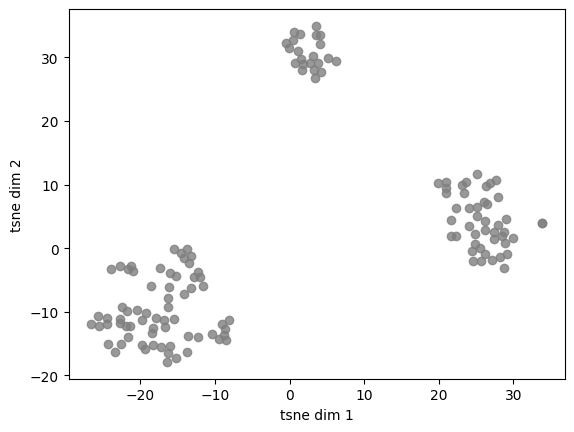

In [ ]:
from sklearn.manifold import TSNE

X = df_shape.loc[:,df_shape.columns.str.startswith('shp')]
X = X.join(df_centroid.centroid_freq) # add column and normalize values

tsne = TSNE(n_components=2, perplexity=12, init='pca', verbose=True)
Y = tsne.fit_transform(X)

fig, ax = plt.subplots()
ax.scatter(Y[:,0], Y[:,1], c='gray', alpha=0.8)
ax.set_xlabel('tsne dim 1')
ax.set_ylabel('tsne dim 2')

In [ ]:
from sklearn.cluster import DBSCAN
cluster = DBSCAN(eps=5, min_samples=4).fit(Y)
print('Number of soundtypes found:', np.unique(cluster.labels_).size)

Number of soundtypes found: 3


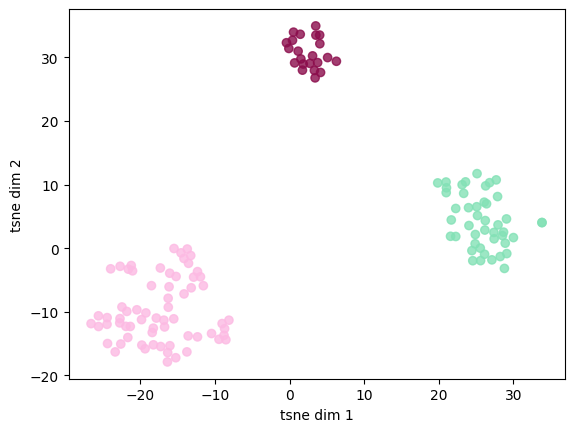

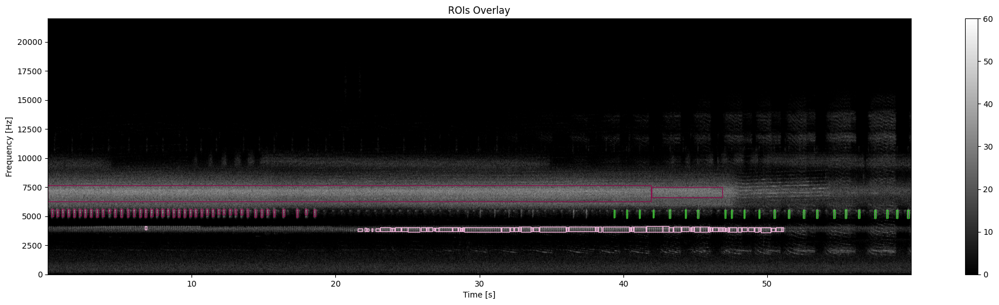

In [ ]:
from maad.util import rand_cmap
fig, ax = plt.subplots()
ax.scatter(Y[:,0], Y[:,1], c=cluster.labels_, cmap=rand_cmap(5 , first_color_black=False), alpha=0.8)
ax.set_xlabel('tsne dim 1')
ax.set_ylabel('tsne dim 2')

# Overlay bounding box on the original spectrogram
df_rois['label'] = cluster.labels_.astype(str)
ax0, fig0 = overlay_rois(Sxx_db, df_rois, **{'vmin':0, 'vmax':60, 'extent':ext})

#another example

In [ ]:
import librosa
import numpy as np

# Cargar el archivo de audio
audio_file = filename
audio, sr = librosa.load(audio_file, sr=44100, mono=True)

# Convertir el audio en un espectrograma
spectrogram = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128, fmax=8000)
spectrogram = librosa.power_to_db(spectrogram, ref=np.max)
spectrogram = spectrogram.astype('float32')

# Normalizar el espectrograma
mean = np.mean(spectrogram)
std = np.std(spectrogram)
spectrogram = (spectrogram - mean) / std

# Añadir una dimensión extra al espectrograma para que tenga la forma de (ancho, altura, canales)
spectrogram = np.expand_dims(spectrogram, axis=-1)


In [ ]:
from tensorflow import keras

# Definir la arquitectura del autoencoder convolucional
input_shape = (spectrogram_width, spectrogram_height, 1)
model = keras.Sequential([
    # Capa codificadora
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=input_shape),
    keras.layers.MaxPooling2D((2, 2), padding='same'),
    keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2), padding='same'),
    keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2), padding='same'),

    # Capa decodificadora
    keras.layers.Conv2D(8, (3, 3), activation='relu', padding='same'),
    keras.layers.UpSampling2D((2, 2)),
    keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same'),
    keras.layers.UpSampling2D((2, 2)),
    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.UpSampling2D((2, 2)),
    keras.layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same'),
])

# Compilar el modelo
model.compile(optimizer='adam', loss='binary_crossentropy')

# Entrenar el modelo
model.fit(x_train, x_train, epochs=10, batch_size=128, validation_data=(x_test, x_test))


In [ ]:
import librosa
import numpy as np
from skimage.filters import threshold_otsu
from skimage.morphology import binary_opening, binary_closing

# Load audio file
y, sr = librosa.load(filename)

# Perform Otsu thresholding on the spectrogram
S = np.abs(librosa.stft(y))
thresh = threshold_otsu(S)
binary = S > thresh

# Perform morphological operations
binary_opened = binary_opening(binary)
binary_closed = binary_closing(binary_opened)

# Extract features
freqs, dominant_freqs, min_freqs, max_freqs, cepstral_coeffs = [], [], [], [], []
for i in range(binary_closed.shape[1]):
    column = binary_closed[:, i]
    freqs.append(librosa.fft_frequencies(sr=sr, n_fft=2048))
    spectrum = np.abs(librosa.stft(y, n_fft=2048)[:, i])
    dominant_freqs.append(freqs[-1][np.argmax(spectrum)])
    min_freqs.append(freqs[-1][np.argmin(column)])
    max_freqs.append(freqs[-1][np.argmax(column)])
    cepstral_coeffs.append(librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20, n_fft=2048, hop_length=512))

# Perform clustering on features
# ... (code to perform clustering not provided as it depends on the specific algorithm used)


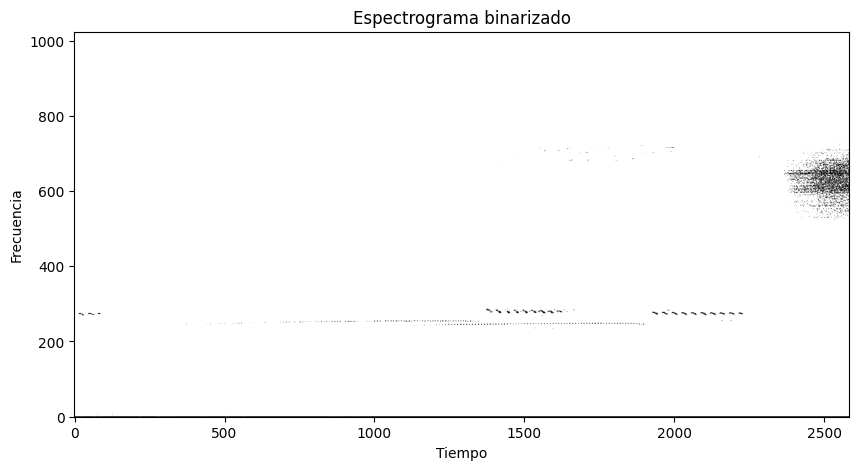

In [ ]:
import matplotlib.pyplot as plt

# Plot binary spectrogram
fig, ax = plt.subplots(figsize=(10,5))
ax.imshow(binary, origin='lower', cmap='gray_r', aspect='auto')
ax.set_xlabel('Tiempo')
ax.set_ylabel('Frecuencia')
ax.set_title('Espectrograma binarizado')
plt.show()


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Input
from tensorflow.keras.models import Model


In [ ]:
def unet(input_size):
    inputs = Input(input_size)
    
    # Encoding Stage
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    # Decoding Stage
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
    up1 = UpSampling2D((2, 2))(conv3)

    conv4 = Conv2D(32, (3, 3), activation='relu', padding='same')(up1)
    conv4 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv4)
    up2 = UpSampling2D((2, 2))(conv4)

    # Output
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(up2)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model


In [ ]:
import librosa
import numpy as np
from scipy import signal

# Cargar archivo de audio
audio, sr = librosa.load(filename)

# Calcular espectrograma
f, t, Sxx = signal.spectrogram(audio, sr)
Sxx_db = librosa.amplitude_to_db(Sxx)

# Normalizar espectrograma
Sxx_db_norm = (Sxx_db - np.min(Sxx_db)) / (np.max(Sxx_db) - np.min(Sxx_db))

# Convertir a imagen
img = np.expand_dims(Sxx_db_norm, axis=-1)
img = np.expand_dims(img, axis=0)


In [ ]:
# Importamos las librerías necesarias
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import librosa
import numpy as np
import tensorflow as tf

audio_file = filename
y, sr = librosa.load(audio_file, sr=44100)
S = librosa.feature.melspectrogram(y=y, sr=sr)
S_dB = librosa.power_to_db(S, ref=np.max)
S_dB_flatten = S_dB.flatten()
thresh = threshold_otsu(S_dB_flatten)
S_otsu = S_dB >= thresh

from scipy.ndimage.morphology import binary_opening

# Realizamos operaciones morfológicas
kernel = np.ones((5,5))
S_opened = binary_opening(S_otsu, kernel)
S_closed = binary_closing(S_opened, kernel)

import scipy

import scipy.ndimage

# Etiquetar las regiones
labelled_array, num_features = scipy.ndimage.label(S_closed)

# Encontrar objetos etiquetados en la imagen
regions = scipy.ndimage.find_objects(labelled_array)

# Crear lista para guardar propiedades de los segmentos
segment_properties = []

# Iterar a través de las regiones y calcular sus propiedades
for r in regions:
    if r is not None:
        segment = S_closed[r]
        properties = {'label': labelled_array[r][0], 'xmin': r[1].start, 'xmax': r[1].stop, 'ymin': r[0].start, 'ymax': r[0].stop, 'duration': (r[0].stop - r[0].start) / sr}
        segment_properties.append(properties)

<ipython-input-28-d3bc45683040>:19: DeprecationWarning: Please use `binary_opening` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import binary_opening


In [ ]:
!pip install pydub



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


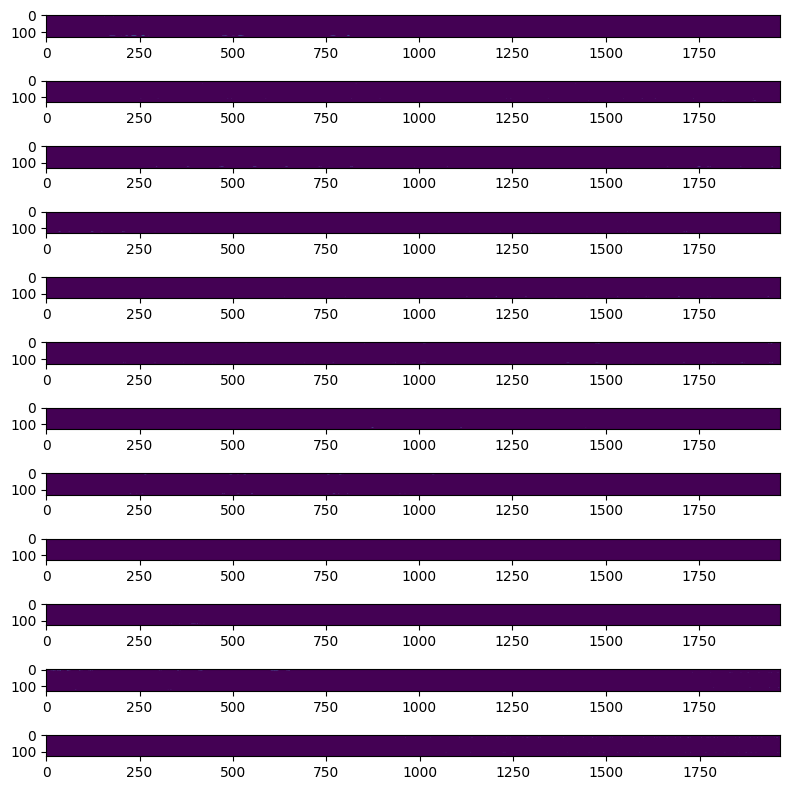

In [ ]:
from pydub import AudioSegment
from pydub.utils import make_chunks
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np

audio = AudioSegment.from_wav(filename)
chunk_duration = 5000  # Duración de cada fragmento de audio en milisegundos
chunks = make_chunks(audio, chunk_duration)
def get_spectrogram(audio_chunk):
    sample_rate = audio_chunk.frame_rate
    samples = np.array(audio_chunk.get_array_of_samples())
    f, t, Sxx = signal.spectrogram(samples, sample_rate)
    threshold = np.max(Sxx) * 0.5  # Umbral de Otsu
    Sxx[Sxx < threshold] = 0
    return f, t, Sxx

spectrograms = []
for chunk in chunks:
    f, t, Sxx = get_spectrogram(chunk)
    spectrograms.append(Sxx)
fig, axs = plt.subplots(len(spectrograms), figsize=(8, 8))
for i in range(len(spectrograms)):
    axs[i].imshow(spectrograms[i], aspect='auto')
plt.tight_layout()
plt.show()



In [ ]:
import numpy as np

def calculate_log_energy(segment):
    """
    Calculates the log energy of a given segment.
    
    Parameters:
    segment (np.ndarray): Segment of audio signal.
    
    Returns:
    float: Log energy of the segment.
    """
    energy = np.sum(np.square(segment))
    log_energy = np.log10(energy + 1e-10)  # To avoid log of zero
    return log_energy




In [ ]:
def extract_dct_features(segment, w=256, num_coefs=24):
    """
    Extracts DCT features from a given segment.
    
    Parameters:
    segment (np.ndarray): Segment of audio signal.
    w (int): Window size for dividing the segment into windows.
    num_coefs (int): Number of DCT coefficients to extract.
    
    Returns:
    np.ndarray: DCT features of the segment.
    """
    windows = segment.reshape(-1, w)
    log_energies = np.apply_along_axis(calculate_log_energy, 1, windows)
    dct_coefs = np.apply_along_axis(
        lambda x: np.fft.rfft(x * np.hamming(w), n=num_coefs),
        1,
        log_energies
    )
    dct_coefs = np.abs(dct_coefs)
    dct_coefs[:, 0] *= np.sqrt(0.5)  # Normalization for k = 0
    dct_coefs /= np.sqrt(w/2)  # Normalization for k > 0
    return dct_coefs[:, :num_coefs]


In [ ]:
def extract_features(segment, sample_rate=44100):
    """
    Extracts features from a given audio segment.
    
    Parameters:
    segment (np.ndarray): Segment of audio signal.
    sample_rate (int): Sampling rate of the audio signal.
    
    Returns:
    np.ndarray: Concatenation of DCT coefficients and spectral features.
    """
    dct_features = extract_dct_features(segment)
    freqs = np.fft.rfftfreq(segment.size, d=1/sample_rate)
    amplitudes = np.abs(np.fft.rfft(segment))
    spectral_features = [freqs[np.argmax(amplitudes)], freqs[1], freqs[-1]]
    features = np.concatenate((dct_features.flatten(), spectral_features))
    return features


In [ ]:
G = np.array([[start_time, end_time, min_freq, max_freq] for start_time, end_time, min_freq, max_freq in segments])

features = []
for i in range(G.shape[0]):
    start_time, end_time, min_freq, max_freq = G[i]
    segment = S[min_freq:max_freq+1, int(start_time*sr):int(end_time*sr)]
    segment_features = extract_features(segment, sr)
    features.append(segment_features)
features = np.array(features)



NameError: ignored